In [1]:
import time
import cv2
import numpy as np
import sys
import getopt
import operator
import math
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import skimage
from skimage import feature
from scipy import ndimage

from pylab import *
from scipy import signal
import scipy as scipy
from PIL import Image


In [2]:
def read_image(IMG_NAME):
    img = mpimg.imread(IMG_NAME)
    return img

In [3]:
def harris(filename, min_distance = 10, threshold = 0.1):
    """
    filename: Path of image file
    threshold: (optional)Threshold for corner detection
    min_distance : (optional)Minimum number of pixels separating 
     corners and image boundary
    """
    im = np.array(Image.open(filename).convert("L"))
    harrisim = compute_harris_response(im)
    filtered_coords = get_harris_points(harrisim,min_distance, threshold)
    plot_harris_points(im, filtered_coords)

def gauss_derivative_kernels(size, sizey=None):
    """ returns x and y derivatives of a 2D 
        gauss kernel array for convolutions """
    size = int(size)
    if not sizey:
        sizey = size
    else:
        sizey = int(sizey)
    y, x = mgrid[-size:size+1, -sizey:sizey+1]
    #x and y derivatives of a 2D gaussian with standard dev half of size
    # (ignore scale factor)
    gx = - x * exp(-(x**2/float((0.5*size)**2)+y**2/float((0.5*sizey)**2))) 
    gy = - y * exp(-(x**2/float((0.5*size)**2)+y**2/float((0.5*sizey)**2))) 
    return gx,gy

def gauss_kernel(size, sizey = None):
    """ Returns a normalized 2D gauss kernel array for convolutions """
    size = int(size)
    if not sizey:
        sizey = size
    else:
        sizey = int(sizey)
    x, y = mgrid[-size:size+1, -sizey:sizey+1]
    g = exp(-(x**2/float(size)+y**2/float(sizey)))
    return g / g.sum()

def compute_harris_response(im):
    """ compute the Harris corner detector response function 
        for each pixel in the image"""
    #derivatives
    gx,gy = gauss_derivative_kernels(3)
    imx = signal.convolve(im,gx, mode='same')
    imy = signal.convolve(im,gy, mode='same')
    #kernel for blurring
    gauss = gauss_kernel(3)
    #compute components of the structure tensor
    Wxx = signal.convolve(imx*imx,gauss, mode='same')
    Wxy = signal.convolve(imx*imy,gauss, mode='same')
    Wyy = signal.convolve(imy*imy,gauss, mode='same')   
    #determinant and trace
    Wdet = Wxx*Wyy - Wxy**2
    Wtr = Wxx + Wyy   
    return Wdet / Wtr

def get_harris_points(harrisim, min_distance=10, threshold=0.1):
    """ return corners from a Harris response image
        min_distance is the minimum nbr of pixels separating 
        corners and image boundary"""
    #find top corner candidates above a threshold
    corner_threshold = max(harrisim.ravel()) * threshold
    harrisim_t = (harrisim > corner_threshold) * 1    
    #get coordinates of candidates
    candidates = harrisim_t.nonzero()
    coords = [ (candidates[0][c],candidates[1][c]) for c in range(len(candidates[0]))]
    #...and their values
    candidate_values = [harrisim[c[0]][c[1]] for c in coords]    
    #sort candidates
    index = argsort(candidate_values)   
    #store allowed point locations in array
    allowed_locations = zeros(harrisim.shape)
    allowed_locations[min_distance:-min_distance,min_distance:-min_distance] = 1   
    #select the best points taking min_distance into account
    filtered_coords = []
    for i in index:
        if allowed_locations[coords[i][0]][coords[i][1]] == 1:
            filtered_coords.append(coords[i])
            allowed_locations[(coords[i][0]-min_distance):(coords[i][0]+min_distance),
                (coords[i][1]-min_distance):(coords[i][1]+min_distance)] = 0               
    return filtered_coords

def plot_harris_points(image, filtered_coords):
    """ plots corners found in image"""
    figure()
    gray()
    imshow(image)
    plot([p[1] for p in filtered_coords],[p[0] for p in filtered_coords],'r*')
    axis('off')
    show()

In [4]:
def SIFT_kp(Il,Ir,N):
    """ returns coordinates of keypoints in Il and Ir which are closest 
    together (in 128D descriptor space) for the N best matches"""
    
    #using SIFT to find keypoints and their corresponding descriptor vectors
    sift = cv2.xfeatures2d.SIFT_create()
    kpl, desl = sift.detectAndCompute(Il,None)
    kpr, desr = sift.detectAndCompute(Ir,None)
    
    #finding distances between all keppoints in descriptor space
    dists = scipy.spatial.distance.cdist(desl, desr, metric='sqeuclidean')

    #finding indeices for best N matches
    indices = np.unravel_index(np.argsort(np.ndarray.flatten(dists)), (len(kpl),len(kpr)))
    indl = indices[0][0:N]
    indr = indices[1][0:N]

    #selecting N best matches
    matchl = [kpl[i] for i in indl]
    matchr = [kpr[i] for i in indr]

    #finding coordinates of N best matches in both images
    coordl = [(int(kp.pt[0]),int(kp.pt[1])) for kp in matchl]
    coordr = [(int(kp.pt[0]),int(kp.pt[1])) for kp in matchr]

    coordl = np.asarray(coordl)
    coordr = np.asarray(coordr)
    
    return coordl, coordr

In [5]:
def Homography(coordl,coordr,Threshold):
    """returns homography matrix for 4 randomly selected match pairs among N best pairs
    also returns inliers which are matches that with current homography, their distance is less than the Threshold"""
    
    #randomly selecting 4 match pairs
    rand_ind = np.arange(len(coordl))
    np.random.shuffle(rand_ind)
    x = coordl[rand_ind[0:4]]
    X = coordr[rand_ind[0:4]]

    #building matrix A
    A = np.zeros((2*len(x),9))
    for i in np.arange(len(x)):
        xi = np.array([x[i,0],x[i,1],1])
        xXi = X[i,0] * xi
        xYi = X[i,1] * xi
        A[2*i,3:6] = xi
        A[2*i+1,0:3] = xi
        A[2*i,6:9] = -xYi
        A[2*i+1,6:9] = -xXi

    #solving eigenvalue problem
    u, s, vh = np.linalg.svd(A, full_matrices=True)

    #building homography matrix
    H = vh[-1].reshape(3,3)

    #converting coordinates into homogenous coordinates
    x = np.concatenate((coordl, np.ones((len(coordl), 1))), axis = 1)
    X = np.concatenate((coordr, np.ones((len(coordr), 1))), axis = 1)

    #finding inliers
    Ninliers = 0
    Inliers = []
    for i in np.arange(len(coordl)):

        Xp = np.matmul(H, x[i])
        Xp /= Xp[-1]

        sqdist = np.linalg.norm(Xp-X[i])
        if sqdist <= Threshold:
            Ninliers += 1
            Inliers.append([x[i],X[i]])

    Inliers = np.asarray(Inliers)

    return Ninliers, Inliers, H
        

In [83]:
def RANSAC(coordl, coordr, Niter):
    """after Niter iterations, returns best homography matrix along with inliers and #inliers 
    and average residual corresponding to the best honography matrix"""

    #iterating to find better homographies
    Nmax_inliers = 0
    for i in np.arange(Niter):
        Ninliers, Inliers, h = Homography(coordl,coordr,Threshold)
        #saving better homographies
        if Ninliers > Nmax_inliers:
            Nmax_inliers = Ninliers
            OPTinliers = Inliers
            H = h

    #finding average residual given best homography
    Residual = 0
    for i in np.arange(Nmax_inliers):
        xp = np.matmul(H,OPTinliers[i,0])
        xp /= xp[-1]
        Residual += (np.linalg.norm(xp - OPTinliers[i,1]))**2
    
    Residual /= Nmax_inliers
    
    return H, Nmax_inliers, OPTinliers, Residual

In [199]:
#reading images and converting to gray scale
input_image_L = read_image('left.jpg')
Il = cv2.cvtColor(input_image_L, cv2.COLOR_BGR2GRAY)
input_image_R = read_image('right.jpg')
Ir = cv2.cvtColor(input_image_R, cv2.COLOR_BGR2GRAY)

# harris('right.jpg')

#defining parameters
Nkp = 40        #number of closest keypoints selected
Threshold = 2   #threshold for finding inliers
Niter = 80      #iterations to find best homography (max inliers)


coordl, coordr = SIFT_kp(Il,Ir,Nkp)
H, Nmax_inliers, OPTinliers, Residual = RANSAC(coordl, coordr, Niter)

Maximum number of Inliers:  18
Average residual:  1.6312904084987028


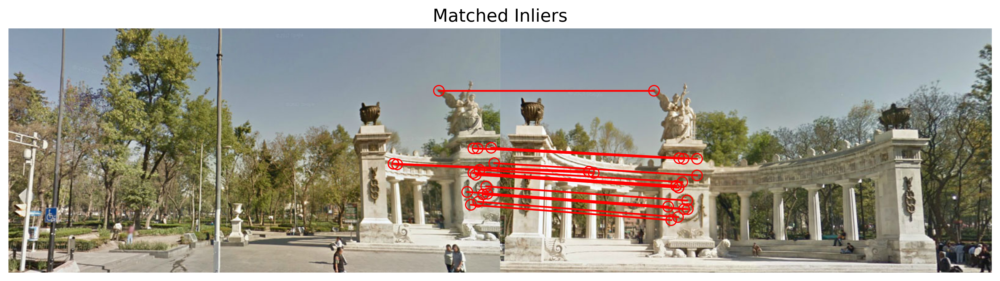

In [281]:
print("Maximum number of Inliers: ", Nmax_inliers)
print("Average residual: ", Residual)
Image = np.concatenate((input_image_L,input_image_R),axis=1)
fig1=plt.figure(figsize=[15,15],dpi=300)
plt.imshow(Image)
for i in np.arange(Nmax_inliers):
    plt.plot([OPTinliers[i,0,0],OPTinliers[i,1,0]+input_image_R.shape[1]], 
             [OPTinliers[i,0,1],OPTinliers[i,1,1]], color='red')
    plt.scatter(OPTinliers[i,0,0], OPTinliers[i,0,1], s=80, facecolors='none', edgecolors='r')
    plt.scatter(OPTinliers[i,1,0]+input_image_R.shape[1], OPTinliers[i,1,1], s=80, facecolors='none', edgecolors='r')
plt.axis('off')
plt.title('Matched Inliers', fontsize=15)
# fig1.savefig('1-inliers.svg',format='svg')

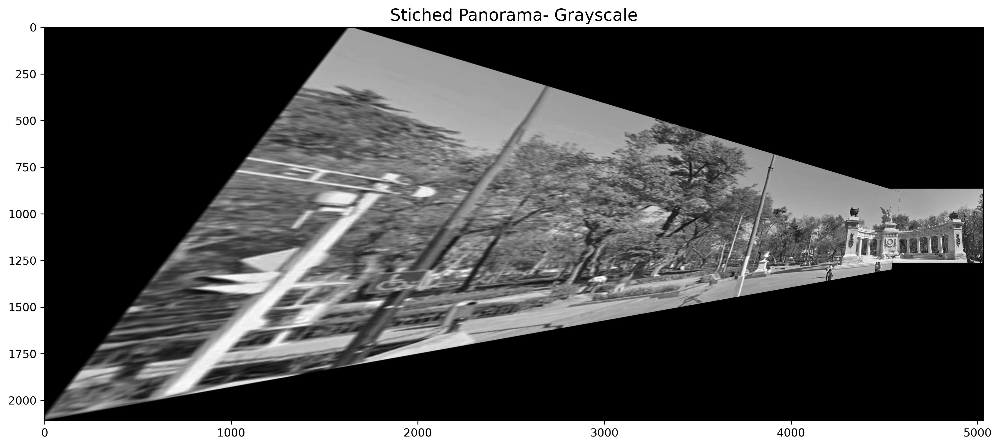

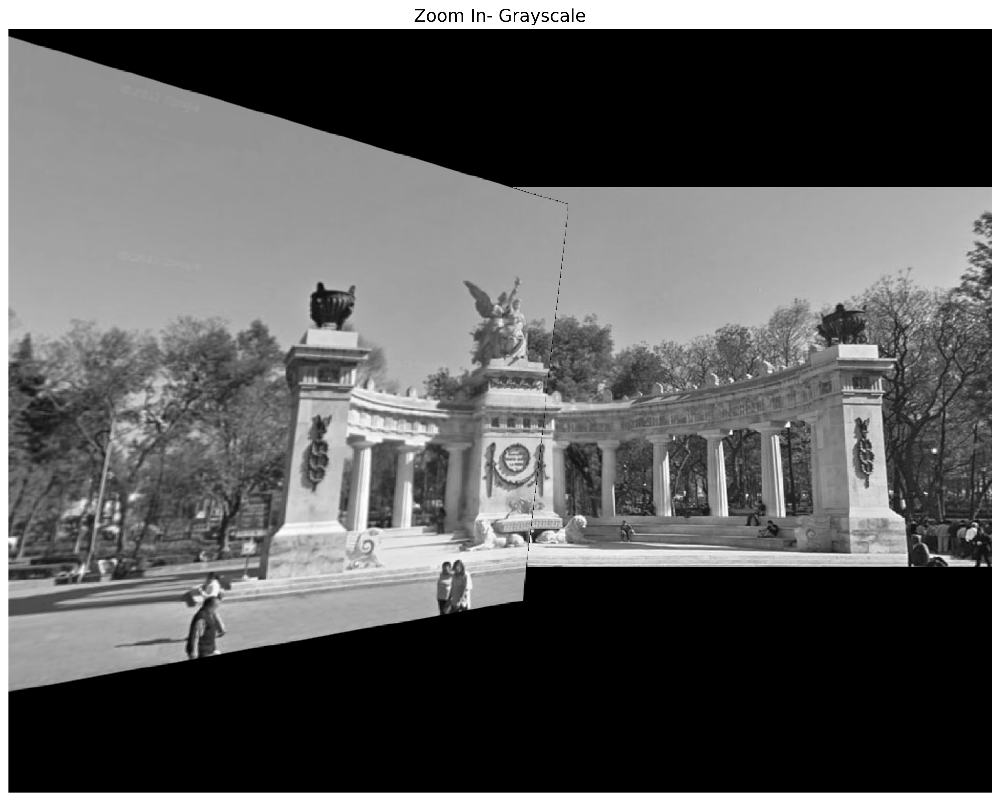

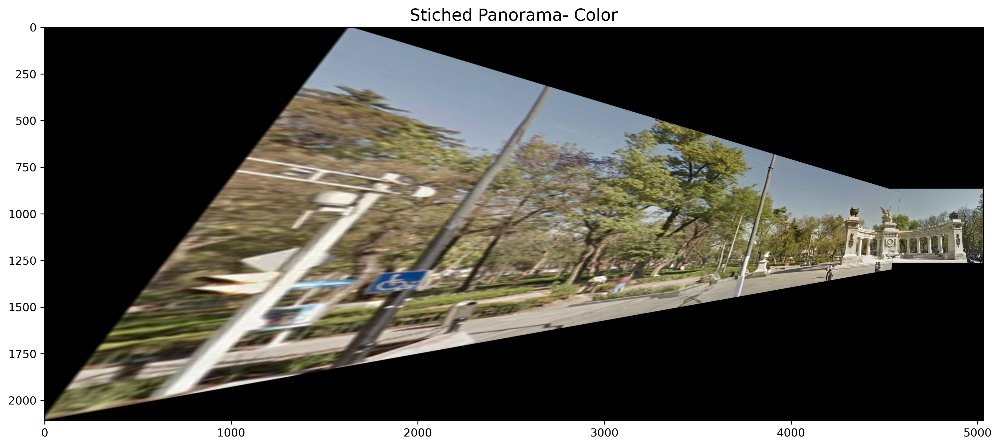

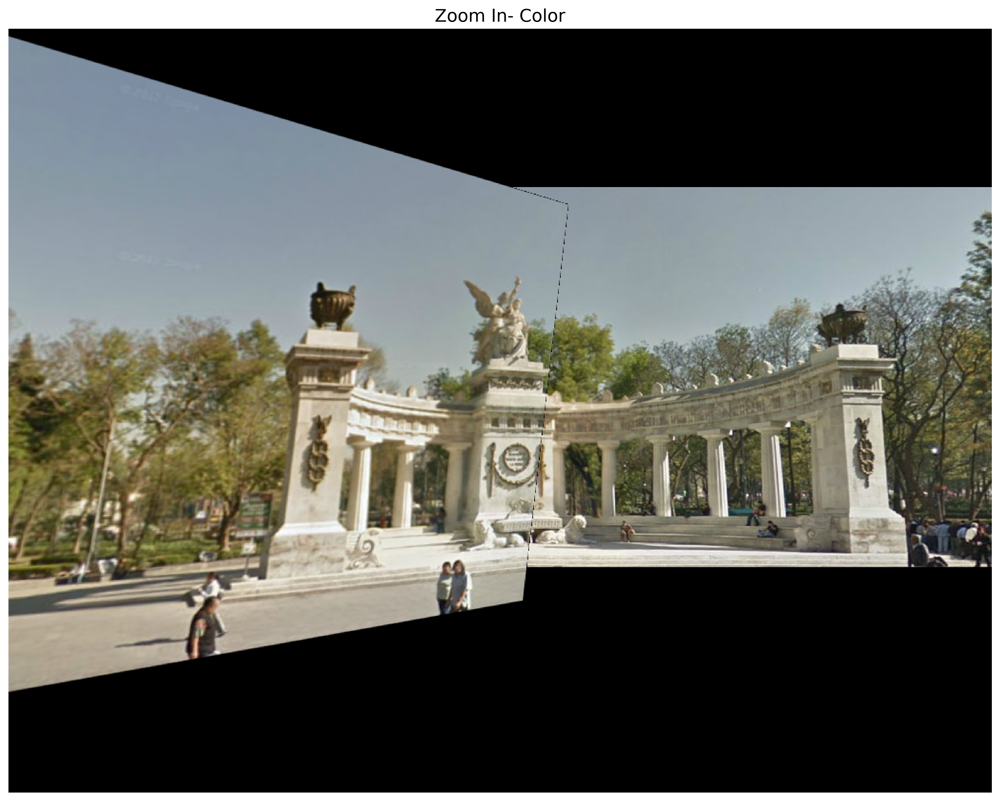

In [276]:
#images size
h, w = Il.shape

#homogenous coordinates of image corners
p = np.array([[0,w,w,0],[0,0,h,h],[1,1,1,1]])

#homogenous coordinates of the warped corners
pp = np.matmul(H,p)
pp /= pp[-1]
pp = np.int32(pp)

#distances needed for trnaslation and panorama frame
d1 = np.min(pp, axis = 1)
d2 = np.max(pp, axis = 1)
dx = -d1[0]
dy = -d1[1]

frame = np.zeros((dy+d2[1],dx+w))

# translation affine 
T = np.array([[1,0,dx],[0,1,dy],[0,0,1]])

#transform for left image (homography followed by translation)
Tl = skimage.transform.ProjectiveTransform(np.matmul(T,H))
#transform for right picture (translation only)
Tr = skimage.transform.ProjectiveTransform(T)

#moving images to panorama frames
Il_p = np.zeros((dy+d2[1],dx+w))
Ir_p = np.zeros((dy+d2[1],dx+w))
Il_p[0:h,0:w] = Il
Ir_p[0:h,0:w] = Ir

#warping images
Il_p = skimage.transform.warp(Il_p, Tl.inverse, preserve_range=True, mode='constant', cval = 0)
Ir_p = skimage.transform.warp(Ir_p, Tr.inverse, preserve_range=True, mode='constant', cval = 0)

#combining images
Ir_p[Il_p!=0]=0
Image = Ir_p+Il_p

fig1=plt.figure(figsize=[15,15],dpi=300)
plt.title('Stiched Panorama- Grayscale', fontsize=15)
imshow(Image, cmap='gray')
# fig1.savefig('1-graypatch.svg',format='svg')

fig2=plt.figure(figsize=[15,15],dpi=300)
imshow(Image[700:1500,4000:-1], cmap='gray')
plt.title('Zoom In- Grayscale', fontsize=15)
plt.axis('off')
# fig2.savefig('1-graypatchplus.svg',format='svg')


#repeating the whole process for color images
ImageC = np.ndarray([dy+d2[1],dx+w,3])

for i in np.arange(3):
    Ir = input_image_R[:,:,i]*1
    Il = input_image_L[:,:,i]*1


    Il_p = np.zeros((dy+d2[1],dx+w))
    Ir_p = np.zeros((dy+d2[1],dx+w))
    
    Il_p[0:h,0:w] = Il
    Ir_p[0:h,0:w] = Ir
    
    Il_p = skimage.transform.warp(Il_p, Tl.inverse, preserve_range=True, mode='constant', cval = 0)
    Ir_p = skimage.transform.warp(Ir_p, Tr.inverse, preserve_range=True, mode='constant', cval = 0)
    
    Ir_p[Il_p!=0]=0
    ImageC[:,:,i] = Ir_p+Il_p

ImageC /= 255

fig3=plt.figure(figsize=[15,15],dpi=300)
plt.title('Stiched Panorama- Color', fontsize=15)
imshow(ImageC)
# fig3.savefig('1-colorpatch.svg',format='svg')

fig4=plt.figure(figsize=[15,15],dpi=300)
imshow(ImageC[700:1500,4000:-1,:])
plt.title('Zoom In- Color', fontsize=15)
plt.axis('off')
# fig4.savefig('1-colorpatchplus.svg',format='svg')